In [1]:
# !pip install moviepy

In [118]:
import numpy as np
import glob, os, sys
import logging
from sys import argv
import timeit
import argparse
import pandas as pd
from pathlib import Path
import re
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
import plotly.graph_objects as go
import functools
vtk_from_pvpython=False # pvpython reads from file, otherwise from paraview GUI
import itertools
import operator
from pathlib import Path
from math import pi
from scipy.signal.windows import blackman # window function
from scipy.signal.windows import barthann
from scipy.signal.windows import chebwin
theta_sym ='\u03B8'
delta_sym = '\u0394'
Sigma_sym = '\u03A3'
omega_sym = '\u03C9'

from scipy.fft import fft, fftfreq

def plot_graph(list_x_, list_y_, names, xtitle, ytitle, image_name, mode=['lines+markers'],\
               xrange=[], yrange=[],\
               dash=['solid', 'dot', 'dash', 'longdash'],\
               colors=['blue', 'red', 'hsv(120,100,100)', 'green', 'black' ],\
               marker_size=15,\
               marker_style = ['circle', 'triangle-up', 'triangle-down','square', 'diamond', 'cross',  'x-thin', 'cross-thin' ],\
               width=1000, height=500, path='./', xlog=False, ylog=False, legend_orientation=None,\
               yanchor=None, y_legend=None, xanchor=None, x_legend=None,\
               linewidth=None):

    list_x, list_y = [], []
    for i,x in enumerate(list_x_):
        y = list_y_[i]
        list_x.append(np.array(x))
        list_y.append(np.array(y))
    if mode == []:
        for i in range(len(list_x)):
            mode.append('lines+markers')
    if xrange == []:
        minx, maxx = [], []
        for i,x in enumerate(list_x):
            minx.append(x.min())
            maxx.append(x.max())
        xrange = [minx, maxx]
    if yrange == []:
        miny, maxy = [], []
        for i,y in enumerate(list_y):
            miny.append(y.min())
            maxy.append(y.max())
        yrange = [miny, maxy]
    figborderlinesize = 0.7
    legborderlinesize = 0.7
    yaxis = dict(
        tickfont = dict(
            family = 'Times New Roman',
            size = 20,
            color = 'black'
        ),
        titlefont = dict(
            family = 'Times New Roman',
            size = 25,
            color = 'black'
        ),
    )
    xaxis = dict(
        tickfont = dict(
            family = 'Times New Roman',
            size = 20,
            color = 'black'
        ),
        titlefont = dict(
            family = 'Times New Roman',
            size = 25,
            color = 'black'
        )
    )

    axis_style = dict(showline=True, gridwidth=1, gridcolor='lightgrey', linewidth=figborderlinesize, linecolor='black', mirror=True, ticks='outside',
                      tickfont = dict(family = 'Times New Roman', size = 20, color = 'black'))
    bg_style = {'plot_bgcolor': 'rgba(255, 255, 255, 1)', 'paper_bgcolor': 'rgba(255, 255, 255, 1)',}


    fig = go.Figure()
    for i,x in enumerate(list_x):
        print('curve number',i)        
        y = list_y[i]
        if linewidth == None:
            linew = 1
        elif np.isscalar(linewidth):
            linew = linewidth
        else:
            linew = linewidth[i]
        fig.add_trace(go.Scatter(x=x, y=y, name=names[i],
                                 mode=mode[i],
                                 marker=dict(
                                     size=marker_size,
                                     line=dict(
                                         color=colors[i],
                                         width=linew
                                     )
                                 ),
                                 marker_symbol=marker_style[i],
                                 line=dict(color=colors[i], width=linew, dash=dash[i]),
                                 textfont=dict(
                                     family="Times New Roman",
                                     size=18,
                                     color="LightSeaGreen")
                                 ))
    fig.update_layout(
        width = width,
        height = height,
        xaxis_title=xtitle,
        yaxis_title=ytitle,
        yaxis = yaxis,
        xaxis = xaxis,
        showlegend=True
    )
    fig.update_layout(bg_style)
    fig.update_xaxes(axis_style)
    fig.update_yaxes(axis_style)
    fig.update_layout(legend=dict(
        yanchor=yanchor,
        y=y_legend,
        xanchor=xanchor,
        x=x_legend,
        bgcolor="White",
        bordercolor="Black",
        borderwidth=figborderlinesize
    ))
    fig.update_layout(
        autosize=False,
        margin=dict(
            l=0,
            r=0,
            b=0,
            t=0,
            pad=0.1
        ),
        #     paper_bgcolor="LightSteelBlue",
    )
    fig.update_xaxes(range=xrange)
    fig.update_yaxes(range=yrange)
    if legend_orientation is not None:
        fig.update_layout(legend_orientation=legend_orientation)

    if xlog:
        fig.update_xaxes(type="log")
    if ylog:
        fig.update_yaxes(type="log")
    fig.show()
    fn = path + image_name
    fig.write_image(str(Path(fn)), engine='kaleido')
    print("Successfully generated:", fn)

def sort2array(key_arr,val_arr):
    return (list(t) for t in zip(*sorted(zip(key_arr,val_arr))))

def fit_periodic(x, y, deg, overlap=0.2, L=2*np.pi, Ninter=1000):
    """
    fit a polynomial of degree deg to a periodic function
    that has a mask

    data - 1d array of periodic function (full interval) e.g. the 
        intensity from 0 -2PI at fixed scattering angle
    mask - masked values corresponding to data (0 is masked, 1 is kept)
    overlap - how far to extend data (fraction of data.shape[0]
    deg - degree of the polynomial fit to data
    """
    N = x.shape[0]
    nn = int(overlap*N)
    x_min = x[0]
    x_max = x[-1]
    x1 = np.copy(x[:nn])
    y1 = np.copy(y[:nn])
    x2 = np.copy(x[-nn:])
    y2 = np.copy(y[-nn:]) 
    x1_minmax = [min(x1), max(x1)]
    x2_minmax = [min(x2), max(x2)]
    x1 += L
    x2 -= L
    xx = np.concatenate((x2, x, x1))
    yy = np.concatenate((y2, y, y1))
    p = np.polynomial.Chebyshev.fit(xx, yy, deg)
    x_ = np.linspace(x[0], x[-1], Ninter);
    y_ = p(x_)
    return x_, y_

def fit(x, y, deg, Ninter=1000):
    N = x.shape[0]
    p = np.polynomial.Chebyshev.fit(x, y, deg)
    x_ = np.linspace(x[0], x[-1], Ninter);
    y_ = p(x_)
    return x_, y_

def my_ceil(a, precision=0):
    return np.round(a + 0.5 * 10**(-precision), precision)

def my_floor(a, precision=0):
    return np.round(a - 0.5 * 10**(-precision), precision)
# Create and show figure
'''
x,y are 1D array
z is 2D array
'''
def plot_2D_color(xx, yy, zz, colorbartitle, xtitle, ytitle, path, fn, Nround=2, 
                  colorscale='Jet', width=500, height=200, inds=None, symmetricalcolorscale=False,
                  zrange=None):
    if inds is None or len(inds) != 4:
        print("inds is all")
        inds = [0, len(xx), 0, len(yy)]
        
    yaxis = dict(
        tickfont = dict(
            family = 'Times New Roman',
            size = 20,
            color = 'black'
        ),
        titlefont = dict(
            family = 'Times New Roman',
            size = 25,
            color = 'black'
        ),
    )
    xaxis = dict(
        tickfont = dict(
            family = 'Times New Roman',
            size = 20,
            color = 'black'
        ),
        titlefont = dict(
            family = 'Times New Roman',
            size = 25,
            color = 'black'
        )
    )
    x = np.copy(xx)
    y = np.copy(yy)
    z = np.copy(zz)
    x = x[inds[0]:inds[1]]
    y = y[inds[2]:inds[3]]
    z = z[inds[2]:inds[3], inds[0]:inds[1]]
    print(len(x), z.shape)
    fig = go.Figure()

    fig.add_trace(go.Heatmap(x=x, 
                             y=y,
                             z=z,
                             colorscale=colorscale,
#                              colorbar=dict(
#                                         title=delta_sym+"x", 
#                                         titlefont=dict(
#                                             size=14,
#                                             family='Times New Roman')                                    
#                                      )
                             colorbar=dict(
                                title=colorbartitle,
                                tickvals=np.linspace(my_floor(z.min(), Nround), my_ceil(z.max(), Nround), 5),
                                thickness=25,
                                titleside="top",
                                tickmode="array",
                                ticks="outside",
                                titlefont=dict(
                                    size=25,
                                    family='Times New Roman')
                             )
    ))

    layout = go.Layout(xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text=xtitle,
            font=dict(size=25,
                      family='Times New Roman')
        )),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text=ytitle,
            font=dict(size=25,
                      family='Times New Roman')
        )
    ))

    fig.update_layout(layout)

    fig.update_layout(font_family="Times New Roman",
                      width=width, height=height,
                      margin=dict(r=0, b=0, l=0, t=0, pad=0.0),
                      autosize=False)
    zmin = my_floor(z.min(), Nround)
    zmax = my_ceil(z.max(), Nround)
    print('zminmax?:', zmin, zmax)
    if symmetricalcolorscale:
        tmp = max(abs(zmin), abs(zmax))
        zmin = -tmp
        zmax = tmp
    if zrange!=None:
        zmin = zrange[0]
        zmax = zrange[1]
    print('zminmax exact:', zmin, zmax)
    fig.data[0].update(zmin=zmin, zmax=zmax)
    fig.update_layout(
        autosize=False,
        margin=dict(
                l=0,
                r=0,
                b=0,
                t=0,
                pad=0
            ),
        #     paper_bgcolor="LightSteelBlue"
    )
    fig.update_layout(
        yaxis = yaxis,
        xaxis = xaxis,
#         showlegend=True
    )
    fig.show()
    fn = path + fn
    print("Successfully saved files:", fn)
    fig.write_image(str(Path(fn)), engine="kaleido")
    


def monotone_increasing(lst):
    pairs = zip(lst, lst[1:])
    return all(itertools.starmap(operator.lt, pairs))

def mean_value(x, y, tavg):
    try:
        sel = (x > tavg[0]) & (x < tavg[1])
        xs = x[sel]
        ys = y[sel]
        T = xs.max() - xs.min()
        print('T mean=', T)
        ss = np.trapz(y=ys, x=xs)
        f_mean = ss/T
        print('ss=', ss, 'fmean=', f_mean)
        return f_mean
    except:
        return None

def myfft(t_full, f_full, window=None, num_output=False, filter_fun=None):
    t = np.array(t_full)
    f = np.array(f_full)
    if window != None and len(window) == 2:
        ind = (t > window[0]) & (t < window[1])
        t = t[ind]
        f = f[ind]
    # Sample duration
    T = t[-1] - t[0]
    # Number of sample points
    N = t.shape[0]
    N_half = np.int(np.ceil(0.5*N))
    # sample spacing
    dt = t[1] - t[0]
    ss = np.trapz(y=f, x=t)   
    f_mean = ss/T
    print('f_mean=', f_mean, '1/(d*N)=', 1/(dt*N), 'handle freq=', (0.5/dt))
    f -= f_mean
    freq = 2*np.pi*fftfreq(N, dt)[:N_half]
#     freq = (np.pi/dt)*np.linspace(0, 1, N_half)
    freq_num = np.arange(N_half)
    
    if filter_fun == None:
        sp = fft(f)
    else:
        w = filter_fun(N)
        sp = fft(w*f)
    freq, sp = zip(*sorted(zip(freq, sp)))
    freq = np.asarray(freq)
    res = np.absolute(sp)**2
    if num_output:
        return freq_num, res
    else:
        return freq, res


In [3]:
# pd.read_csv(path + file)

In [169]:
path = '/home/e.sharaborin/results/tube/res22_adaptffsu/upd_calc/csv/'
# path = '/home/e.sharaborin/basilisk/work/tube/'

# Read all sheets in your File
pattern = 'piece_table_t=*.csv'

files_full = [os.path.basename(x) for x in glob.glob(path + pattern)]
times_full = [float(re.findall(r"[-+]?\d*\.\d+|\d+", x)[0]) for x in files_full]
times_full, files_full = sort2array(times_full, files_full)
files_with_path_full = [path + f for f in files_full]
assert (len(files_full) == len(times_full))

################################################
Npolyfit = 50
Ninter = 1000
Ntimes = len(times_full)
T = max(times_full) - min(times_full)

theta_full = np.zeros((Ninter, Ntimes))
x = []
y = []
z = []

x_raw = []
y_raw = []
z_raw = []

Atmp_full = np.zeros((Ninter, Ntimes))
# fig = go.Figure()
deviation_max = []
for i,time in enumerate(times_full):
    file = files_full[i]
    tab = pd.read_csv(path + file, usecols=["Points:0", "theta", "x_tail_rel", "t", "x_tail_rel_nose"])
    x_nose = tab['Points:0'].max()
#     print("time:", time, 'file:', file)
#     print('x_nose', x_nose)
    if False:
        inds = tab['theta'].diff() <= 0
        xx = tab['t'].drop(tab.index[inds]).values
        yy = tab['theta'].drop(tab.index[inds]).values
        zz = tab['x_tail_rel'].drop(tab.index[inds]).values
        f = CubicSpline(yy, zz)
        y_ = np.linspace(yy[0], yy[-1], Ninter)
        z_ = f(y_)
    else:
        xx = tab['t'].values
        yy = tab['theta'].values
#         zz = tab['x_tail_rel'].values
        zz = tab['x_tail_rel_nose'].values
        ss = np.trapz(y=zz, x=yy)  
        T = yy.max() - yy.min()
        f_mean = ss/T
        zz -= f_mean
        y_, z_ = fit_periodic(yy, zz, Npolyfit, overlap=0.2, L=2*np.pi, Ninter=Ninter)
    
    
    Atmp_full[:,i] = z_
    theta_full[:,i] = y_
    x_ = xx[0]*np.ones(Ninter)
    x = x + x_.tolist()
    y = y + y_.tolist()
    z = z + z_.tolist()
    x_raw = x_raw + xx.tolist()
    y_raw = y_raw + yy.tolist()
    z_raw = z_raw + zz.tolist()
    deviation_max.append(tab['x_tail_rel'].max())
    
A_full = np.zeros((Ninter, Ntimes))
times_new_full = np.linspace(times_full[0], times_full[-1], Ntimes)
x_new = np.linspace(0, 2*np.pi, Ninter)

Npolyfit = 70
# plt.figure(figsize=(20,6))
for j in range(Ninter):
    xx = np.array(times_full)
    zz = Atmp_full[j,:]
    f = CubicSpline(xx, zz)
    z_ = f(times_new_full)
    A_full[j,:] = z_
#     if j == 457:
#         plt.plot(times_new_full, z_, 'r-')
#         plt.plot(times_full, zz, 'b.')



In [205]:
# cut specific times_full
sym = False
if sym:
    t_start, t_end = 4.28, 11
    i_start, i_end = (np.abs(np.asarray(times_full) - t_start)).argmin(), (np.abs(np.asarray(times_full) - t_end)).argmin()
    prefix_sym='sym'
    omega_list = [0.9536482, 6.675537, 9.536482, 16.21202]
    k_list = [0.999, 1.998, 3.996]
else:
    t_start, t_end = 13, 20
    i_start, i_end = (np.abs(np.asarray(times_full) - t_start)).argmin(), (np.abs(np.asarray(times_full) - t_end)).argmin()
    prefix_sym='not_sym'
    omega_list = [1.039305, 5.196526, 9.353747, 15.58958]
    k_list = [0.999,1.998,2.997]

# i_start, i_end = 0, Ntimes

Ntimes = i_end - i_start
A = np.array(A_full[:,i_start:i_end])
Atmp = np.array(Atmp_full[:,i_start:i_end])
times_new = np.array(times_new_full[i_start:i_end])
times = np.array(times_full[i_start:i_end])
theta = np.array(theta_full[:,i_start:i_end])
files = np.array(files_full[i_start:i_end])
files_with_path = np.array(files_with_path_full[i_start:i_end])

In [206]:
#3D picture
title = "\u0394x"

cmaps = ["Blackbody",
"Bluered",
"Blues",
"Earth",
"Electric",
"Greens",
"Greys",
"Hot",
"Jet",
"Picnic",
"Portland",
"Rainbow",
"RdBu",
"Reds",
"Viridis",
"YlGnBu",
"YlOrRd"]

cmaps = ['aggrnyl', 'agsunset', 'algae', 'amp', 'armyrose', 'balance',
             'blackbody', 'bluered', 'blues', 'blugrn', 'bluyl', 'brbg',
             'brwnyl', 'bugn', 'bupu', 'burg', 'burgyl', 'cividis', 'curl',
             'darkmint', 'deep', 'delta', 'dense', 'earth', 'edge', 'electric',
             'emrld', 'fall', 'geyser', 'gnbu', 'gray', 'greens', 'greys',
             'haline', 'hot', 'hsv', 'ice', 'icefire', 'inferno', 'jet',
             'magenta', 'magma', 'matter', 'mint', 'mrybm', 'mygbm', 'oranges',
             'orrd', 'oryel', 'oxy', 'peach', 'phase', 'picnic', 'pinkyl',
             'piyg', 'plasma', 'plotly3', 'portland', 'prgn', 'pubu', 'pubugn',
             'puor', 'purd', 'purp', 'purples', 'purpor', 'rainbow', 'rdbu',
             'rdgy', 'rdpu', 'rdylbu', 'rdylgn', 'redor', 'reds', 'solar',
             'spectral', 'speed', 'sunset', 'sunsetdark', 'teal', 'tealgrn',
             'tealrose', 'tempo', 'temps', 'thermal', 'tropic', 'turbid',
             'turbo', 'twilight', 'viridis', 'ylgn', 'ylgnbu', 'ylorbr',
             'ylorrd']
# for cm in cmaps:
#     print(cm)
cm = 'Jet'
plot_2D_color(times_new, x_new, A, 
          title, 't', 'C', 
          path, '/x_over_t_{}.png'.format(prefix_sym), Nround=3, colorscale=cm, width=1000, height=400, 
          symmetricalcolorscale=True, 
#           zrange=[-0.03, 0.03]
          zrange=[A.min(), A.max()]
             )
# plot_2D_color(times_new, x_new, Atmp, 
#               "|x<sub>tail</sub> - x<sub>nose</sub>|", 't', 'C', 
#               path, '/x_over_t.png', colorscale='Jet', width=500, height=200)

# plt.figure(figsize=(20,7))
# for line in range(0,5):
#     ii = 10*line
#     plt.plot(times_new, A[ii,:], '-', label='i={}'.format(line))
# plt.legend()
# plt.show()

# plt.figure(figsize=(20,7))
# for tt in range(0,5):
#     ii = 10*tt
#     plt.plot(theta[:,ii], A[:,ii], '-', label='t={}'.format(tt))
# plt.legend()
# plt.show()

inds is all
167 (1000, 167)
zminmax?: -0.048 0.055
zminmax exact: -0.047975834089870446 0.05425826207163251


Successfully saved files: /home/e.sharaborin/results/tube/res22_adaptffsu/upd_calc/csv//x_over_t_not_sym.png


# SVD decomposition

In [207]:
# print(Atmp.shape)
# utmp, stmp, vhtmp = np.linalg.svd(Atmp, full_matrices=True)
# print(utmp.shape, stmp.shape, vhtmp.shape)

print(A.shape)
u, s, vh = np.linalg.svd(A, full_matrices=True)
v = vh.T.copy()

sigma = np.zeros((Ninter,Ntimes))
sigma[:Ntimes,:Ntimes] = np.diag(s)

print(u.shape, s.shape, vh.shape)

plot_2D_color(np.arange(1,Ninter+1), x_new, u, "U", 'i', 'C', path, '/u_i_x.png', Nround=2, colorscale='Jet', width=300, height=400,
             inds=[0, 5, 0, Ninter])

plot_2D_color(np.arange(1,Ninter+1), times_new, v, "V", 'i', 't', path, '/v_i_x.png', Nround=2, colorscale='Jet', width=300, height=400,
             inds=[0, 5, 0, Ntimes])

# plot_2D_color(np.arange(Ninter), x_new, usigma, "U\u03A3", 'i', 'C', path, '/usigma_i_x.eps', Nround=2, colorscale='Viridis', width=300, height=400,
#              inds=[0, 10, 0, Ninter])

# plot_2D_color(np.arange(Ninter), times_new, vsigmaT, "\u03A3V<sup>T</sup>", 'i', 't', path, '/sigmaVT_i_x.eps', Nround=2, colorscale='Viridis', width=300, height=400,
#              inds=[0, 10, 0, Ntimes])

total_energy = (s*s).sum()
power = s[s > 0.01*total_energy]**2/total_energy
Nmain = s[s > 0.01*total_energy].shape[0]

print('power=', s[s > 0.01*total_energy]**2, 'normalized power=', power, 'Nmain=', Nmain)
# plt.plot(power, 'b.')
np.cumsum(power)

(1000, 167)
(1000, 1000) (167,) (167, 167)
5 (1000, 5)
zminmax?: -0.07 0.06
zminmax exact: -0.07 0.06


Successfully saved files: /home/e.sharaborin/results/tube/res22_adaptffsu/upd_calc/csv//u_i_x.png
5 (167, 5)
zminmax?: -0.26 0.21
zminmax exact: -0.26 0.21


Successfully saved files: /home/e.sharaborin/results/tube/res22_adaptffsu/upd_calc/csv//v_i_x.png
power= [17.82383166  2.833157    1.31982549  0.31547041  0.1108332   0.08313728
  0.06260763] normalized power= [0.78797051 0.12525052 0.05834792 0.01394657 0.0048998  0.0036754
 0.00276781] Nmain= 7


array([0.78797051, 0.91322103, 0.97156896, 0.98551553, 0.99041534,
       0.99409074, 0.99685855])

In [208]:
plot_2D_color(times_new, np.arange(Ninter), sigma@vh, "\u03A3V<sup>T</sup>", 't', 'i', path, '/sigmaVT_i_x.png', Nround=2, colorscale='Viridis', width=500, height=200,
             inds=[0, Ntimes, 0, 10])

167 (10, 167)
zminmax?: -0.79 0.87
zminmax exact: -0.79 0.87


Successfully saved files: /home/e.sharaborin/results/tube/res22_adaptffsu/upd_calc/csv//sigmaVT_i_x.png


In [209]:
# Reduced
Nmain = 4
sss = np.zeros((Ninter,Ntimes))
sss[:Ntimes,:Ntimes] = np.diag(s)
u@sss@vh

sss = np.diag(s[:Nmain])
A_red = u[:,:Nmain]@sss@vh[:Nmain,:]

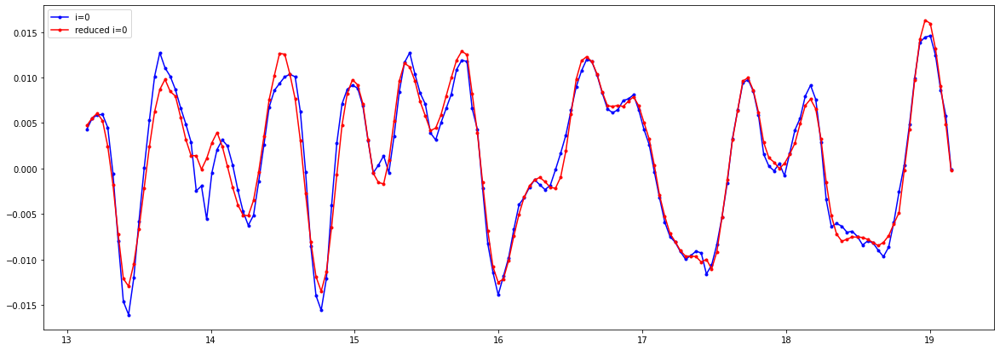

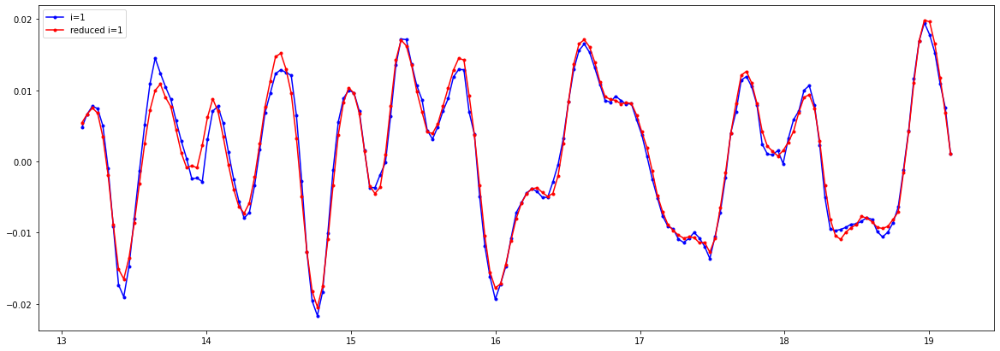

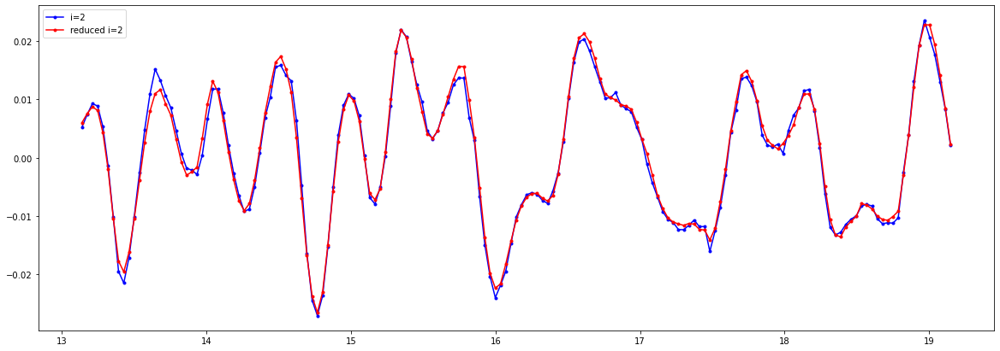

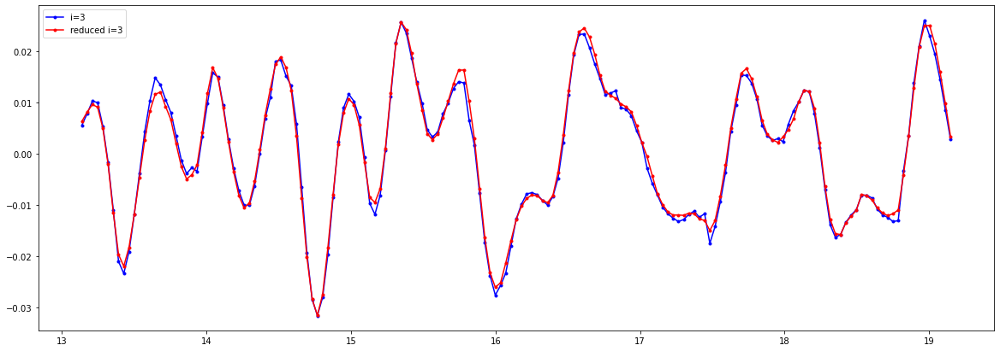

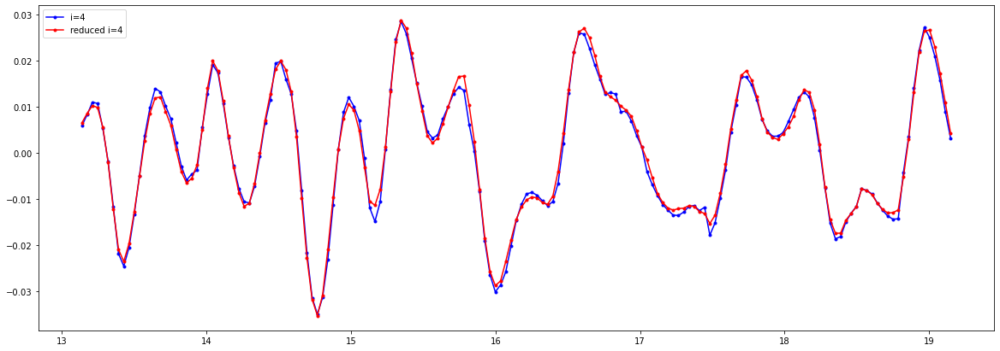

...

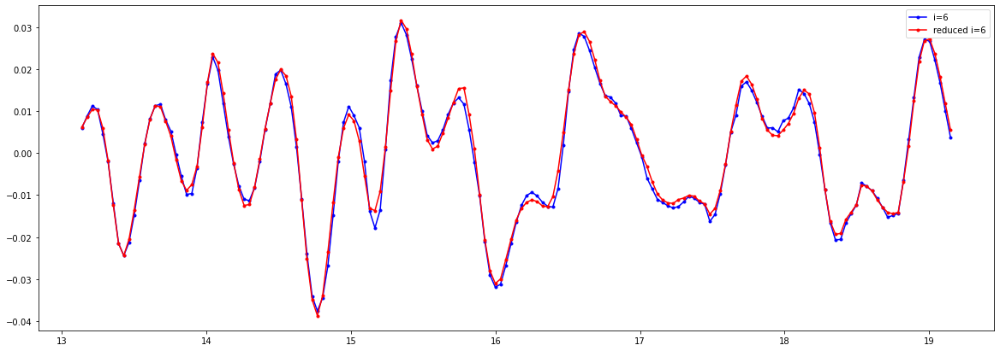

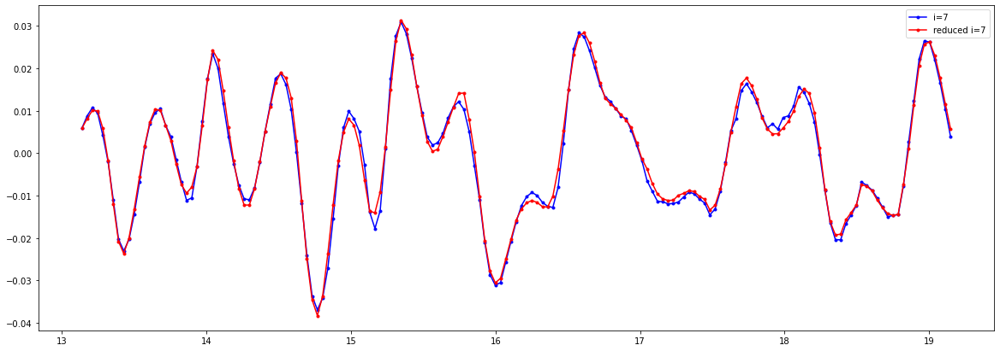

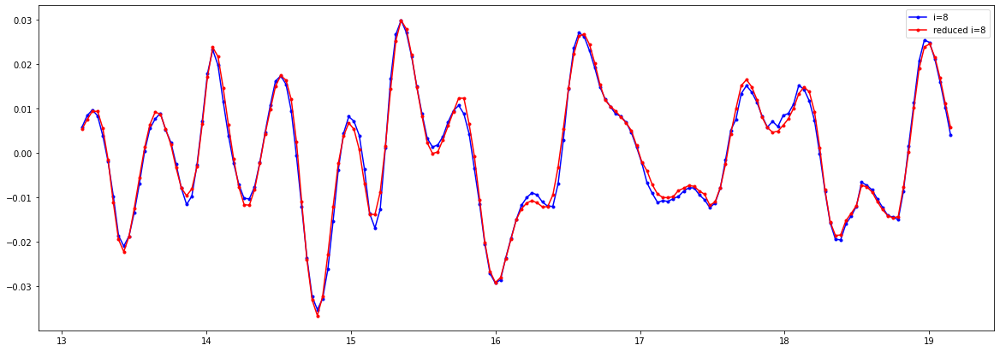

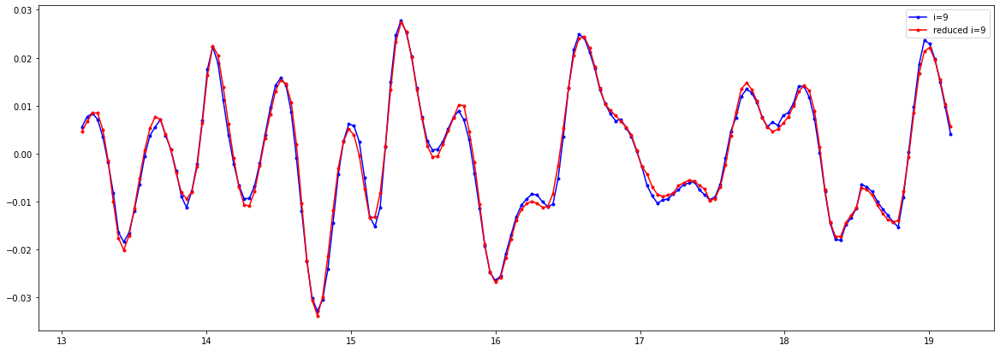

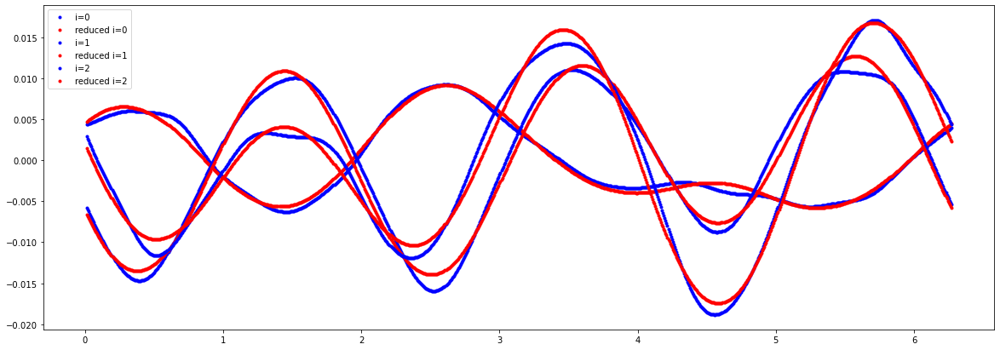

In [210]:
for i in range(0,10):
    ii = 10*i
    plt.figure(figsize=(20,7))
    plt.plot(times_new, A[ii,:], 'b.-', label='i={}'.format(i))
    plt.plot(times_new, A_red[ii,:], 'r.-', label='reduced i={}'.format(i))

    plt.legend()
    plt.show()

plt.figure(figsize=(20,7))
for i in range(0,3):
    ii = 10*i
    plt.plot(theta_full[:,ii], A[:,ii], 'b.', label='i={}'.format(i))
    plt.plot(theta_full[:,ii], A_red[:,ii], 'r.', label='reduced i={}'.format(i))
plt.legend()
plt.show()

# U and Fourier transform

In [211]:
list_x, list_y, names, mode = [], [], [], []
list_fx, list_fy, namesf, modef = [], [], [], []

for i in range(3):
    list_x.append(x_new)
    list_y.append(u[:,i])
    names.append('i={}'.format(i+1))
    mode.append('lines')
    
    freq, p = myfft(x_new, u[:,i], window=None)
    list_fx.append(freq)
    list_fy.append(p)

    namesf.append('i={}'.format(i+1))
    modef.append('lines')

for omega0 in k_list:
    list_fx.append([omega0, omega0])
    list_fy.append([0, 700])
    namesf.append('{}={}'.format('k', np.round(omega0,2)))
    modef.append('lines')
    
fn = "u_C_{}.eps".format(prefix_sym)
plot_graph(list_x, list_y, names=names, xtitle='C', ytitle='U<sub>i</sub>', \
               image_name=fn, mode=mode,\
               dash=['solid', 'solid', 'solid', 'dash', 'dash', 'dash', 'dash', 'dash'],\
# 			   colors=['blue', 'red', 'hsv(120,100,100)', 'green', 'indigo', 'aqua', 'goldenrod', 'black', 'pink'],\
               marker_size=10,\
# 			   marker_style = ['circle', 'triangle-up', 'triangle-down','square', 'diamond', 'cross',  'x-thin', 'cross-thin', 'circle', 'triangle-up', 'triangle-down' ],\
               width=500, height=500, path=path, xanchor='right', yanchor='top', x_legend=1, y_legend=1, linewidth=1.5)

fn = "fourier_u_k_{}.eps".format(prefix_sym)
plot_graph(list_fx, list_fy, names=namesf, xtitle='k', ytitle='P(U<sub>i</sub>)',
               image_name=fn, mode=modef,
               xrange=[0,15], yrange=[0,500],
               dash=['solid', 'solid', 'solid', 'dot', 'dot', 'dot', 'dash', 'dash'],
               colors=['blue', 'red', 'hsv(120,100,100)', 'grey', 'grey', 'grey', 'grey', 'grey', 'grey'],
               marker_size=10,
# 			   marker_style = ['circle', 'triangle-up', 'triangle-down','square', 'diamond', 'cross',  'x-thin', 'cross-thin', 'circle', 'triangle-up', 'triangle-down' ],
               width=500, height=500, path=path, xanchor='right', yanchor='top', x_legend=1, y_legend=1, linewidth=[1.5,1.5,1.5,2,2,2])

fn = "fourierlog_u_k_{}.eps".format(prefix_sym)
plot_graph(list_fx, list_fy, names=namesf, xtitle='k', ytitle='P(U<sub>i</sub>)',
               image_name=fn, mode=modef,
               xrange=[0,15], yrange=[-4,3],
               dash=['solid', 'solid', 'solid', 'dot', 'dot', 'dot', 'dash', 'dash'],
               colors=['blue', 'red', 'hsv(120,100,100)', 'grey', 'grey', 'grey', 'grey', 'grey', 'grey'],
               marker_size=10,
# 			   marker_style = ['circle', 'triangle-up', 'triangle-down','square', 'diamond', 'cross',  'x-thin', 'cross-thin', 'circle', 'triangle-up', 'triangle-down' ],
               width=500, height=500, path=path, xanchor='right', yanchor='top', x_legend=1, y_legend=1, linewidth=[1.5,1.5,1.5,2,2,2], ylog=True )


f_mean= -3.0815307163061386e-06 1/(d*N)= 0.15899578814880347 handle freq= 79.49789407440173
f_mean= 3.8923739074878405e-05 1/(d*N)= 0.15899578814880347 handle freq= 79.49789407440173
f_mean= -3.875704273209187e-05 1/(d*N)= 0.15899578814880347 handle freq= 79.49789407440173
curve number 0
curve number 1
curve number 2


Successfully generated: /home/e.sharaborin/results/tube/res22_adaptffsu/upd_calc/csv/u_C_not_sym.eps
curve number 0
curve number 1
curve number 2
curve number 3
curve number 4
curve number 5


Successfully generated: /home/e.sharaborin/results/tube/res22_adaptffsu/upd_calc/csv/fourier_u_k_not_sym.eps
curve number 0
curve number 1
curve number 2
curve number 3
curve number 4
curve number 5


Successfully generated: /home/e.sharaborin/results/tube/res22_adaptffsu/upd_calc/csv/fourierlog_u_k_not_sym.eps


$\sigma^2_i/\sum_j\sigma_j^2$

# V over omega

In [212]:
vht = np.copy(vh.T)

list_x, list_y, names, mode = [], [], [], []
list_fx, list_fy, namesf, modef = [], [], [], []

for i in range(3):
    list_x.append(times_new)
    list_y.append(vht[:,i])
    names.append('i={}'.format(i+1))
    mode.append('lines')
    
    freq, p = myfft(times_new, v[:,i], window=None)
    list_fx.append(freq)
    list_fy.append(p)

    namesf.append('i={}'.format(i+1))
    modef.append('lines')

for omega0 in omega_list:
    list_fx.append([omega0, omega0])
    list_fy.append([0, 700])
    namesf.append('{}={}'.format(omega_sym, np.round(omega0, 2)))
    modef.append('lines')
    
fn = "v_t_{}.eps".format(prefix_sym)
plot_graph(list_x, list_y, names=names, xtitle='t', ytitle='V<sub>i</sub>', \
               image_name=fn, mode=mode,\
               dash=['solid', 'solid', 'solid', 'dash', 'dash', 'dash', 'dash', 'dash'],\
# 			   colors=['blue', 'red', 'hsv(120,100,100)', 'green', 'indigo', 'aqua', 'goldenrod', 'black', 'pink'],\
               marker_size=10,\
# 			   marker_style = ['circle', 'triangle-up', 'triangle-down','square', 'diamond', 'cross',  'x-thin', 'cross-thin', 'circle', 'triangle-up', 'triangle-down' ],\
               width=500, height=500, path=path, xanchor='left', yanchor='top', x_legend=0, y_legend=1,  linewidth=[1.5,1.5,1.5,2,2,2])

fn = "fourier_v_t_{}.eps".format(prefix_sym)
plot_graph(list_fx, list_fy, names=namesf, xtitle=omega_sym, ytitle='P(V<sub>i</sub>)',
               image_name=fn, mode=modef,
               xrange=[0,20], yrange=[0,70],
               dash=['solid', 'solid', 'solid', 'dot', 'dot', 'dot', 'dot', 'dot'],
               colors=['blue', 'red', 'hsv(120,100,100)', 'grey', 'grey', 'grey', 'grey', 'grey', 'grey'],
               marker_size=10,
# 			   marker_style = ['circle', 'triangle-up', 'triangle-down','square', 'diamond', 'cross',  'x-thin', 'cross-thin', 'circle', 'triangle-up', 'triangle-down' ],
               width=500, height=500, path=path, xanchor='right', yanchor='top', x_legend=1, y_legend=1,  linewidth=[1.5,1.5,1.5,2,2,2,2])

fn = "fourierlog_v_t_{}.eps".format(prefix_sym)
plot_graph(list_fx, list_fy, names=namesf, xtitle=omega_sym, ytitle='P(V<sub>i</sub>)',
               image_name=fn, mode=modef,
               xrange=[0,20], yrange=[-3,3],
               dash=['solid', 'solid', 'solid', 'dot', 'dot', 'dot', 'dot', 'dot'],
               colors=['blue', 'red', 'hsv(120,100,100)', 'grey', 'grey', 'grey', 'grey', 'grey', 'grey'],
               marker_size=10,
# 			   marker_style = ['circle', 'triangle-up', 'triangle-down','square', 'diamond', 'cross',  'x-thin', 'cross-thin', 'circle', 'triangle-up', 'triangle-down' ],
               width=500, height=500, path=path, xanchor='right', yanchor='bottom', x_legend=1, y_legend=0,  linewidth=[1.5,1.5,1.5,2,2,2,2], ylog=True, legend_orientation='h')


f_mean= -0.00039989493814205344 1/(d*N)= 0.16541055628235682 handle freq= 13.811781449576793
f_mean= 0.02999053463324457 1/(d*N)= 0.16541055628235682 handle freq= 13.811781449576793
f_mean= -0.019582435223564607 1/(d*N)= 0.16541055628235682 handle freq= 13.811781449576793
curve number 0
curve number 1
curve number 2


Successfully generated: /home/e.sharaborin/results/tube/res22_adaptffsu/upd_calc/csv/v_t_not_sym.eps
curve number 0
curve number 1
curve number 2
curve number 3
curve number 4
curve number 5
curve number 6


Successfully generated: /home/e.sharaborin/results/tube/res22_adaptffsu/upd_calc/csv/fourier_v_t_not_sym.eps
curve number 0
curve number 1
curve number 2
curve number 3
curve number 4
curve number 5
curve number 6


Successfully generated: /home/e.sharaborin/results/tube/res22_adaptffsu/upd_calc/csv/fourierlog_v_t_not_sym.eps


# delta x over t convert mp4

In [14]:

if False:
    df = pd.DataFrame({'t':x, 'C':y, '|x<sub>tail</sub> - x<sub>nose</sub>|':z})
    df_raw = pd.DataFrame({'t':x_raw, 'C':y_raw, '|x<sub>tail</sub> - x<sub>nose</sub>|':z_raw})
    import plotly.express as px

    width, height = 1000, 500

    #animation_frame="x",
    image_path = []
    for i,time in enumerate(times):
    #     print("i={}, time={}".format(i, time))
        df_ = df_raw.loc[np.isclose(df_raw['t'],time)]
        y_ = df_["C"].values
        z_ = df_["|x<sub>tail</sub> - x<sub>nose</sub>|"].values
        fig = go.Figure(go.Scatter(x=y_, 
                                   y=z_, 
                                   name=delta_sym+"x",
                                   marker=dict(
                                     size=5,
                                     cmax=0.1,
                                     cmin=0,
                                     color=z_, #list(map(SetColor, z_)),
                                     colorbar=dict(
                                        title=delta_sym+"x", 
                                        titlefont=dict(
                                            size=14,
                                            family='Times New Roman')                                    
                                     ),
    #                                  colorscale="jet",
                                        line=dict(color='rgb(200,200,200)')
                                   ),
                                   mode="markers+lines")
                       )

        df_ = df.loc[np.isclose(df['t'],time)]
        y_ = df_["C"]
        z_ = df_["|x<sub>tail</sub> - x<sub>nose</sub>|"]
        fig.add_trace(go.Scatter(x=y_, 
                                 y=z_, 
                                 mode="lines", name=None, 
                                 line=dict(
                                 color='red'),
                                 textfont=dict(
                                     family="Times New Roman",
                                     size=14,
                                     color="LightSeaGreen")))

        yaxis = dict(
            tickfont = dict(
                family = 'Times New Roman',
                size = 20,
                color = 'black'
            ),
            titlefont = dict(
                family = 'Times New Roman',
                size = 25,
                color = 'black'
            ),
        )
        xaxis = dict(
            tickfont = dict(
                family = 'Times New Roman',
                size = 20,
                color = 'black'
            ),
            titlefont = dict(
                family = 'Times New Roman',
                size = 25,
                color = 'black'
            )
        )

        axis_style = dict(showline=True, gridwidth=1, gridcolor='lightgrey', linewidth=0.1, linecolor='black', mirror=True, ticks='outside',
                          tickfont = dict(family = 'Times New Roman', size = 20, color = 'black'))
        bg_style = {'plot_bgcolor': 'rgba(255, 255, 255, 1)', 'paper_bgcolor': 'rgba(255, 255, 255, 1)',}

        fig.update_layout(bg_style)
        fig.update_xaxes(axis_style)
        fig.update_yaxes(axis_style)

        fig.update_yaxes(range=[0,0.1])

        fig.update_layout(width = width,
                          height = height,
                          xaxis_title=theta_sym,
                          yaxis_title=delta_sym + 'x',
                          yaxis = yaxis,
                          xaxis = xaxis,
                          showlegend=False)

        fig.update_layout(
            title={
                'text': "t={:5.3f}".format(time),
                'y':0.9,
                'x':0.5,
                'xanchor': 'center',
                'yanchor': 'top'},
            font=dict(
                family='Times New Roman',
                size=18,
                color="RebeccaPurple"
            )
        )


    #     fig.add_trace(px.scatter(df.loc[np.isclose(df['t'],time)], x="C", y="|x<sub>tail</sub> - x<sub>nose</sub>|", color="|x<sub>tail</sub> - x<sub>nose</sub>|",
    #         range_y=[0,0.1], range_color=[0,0.05], width=1000, height=500, title='t={}'.format(time)))#animation_group="country",

    #     fig.show()
        fn = path + '/figs_tail/plot_{:04d}.png'.format(i)
        image_path.append(fn)
        fig.write_image(str(Path(fn)), engine="kaleido", width=width, height=height, scale=2)
        
import os
import moviepy.video.io.ImageSequenceClip
if False:
    image_folder=path+'figs_tail/'
    fps=25
    # image_files = [image_folder+'/'+img for img in os.listdir(image_folder) if img.endswith(".png")]
    clip = moviepy.video.io.ImageSequenceClip.ImageSequenceClip(image_path, fps=fps)
    clip.write_videofile(path + 'deltax_t.mp4')

In [26]:
fn = path + "deviation_max.pdf"
plot_graph([times_new], [deviation_max], names=['deviation'], xtitle='t', ytitle='max|x<sub>tail</sub> - x<sub>nose</sub>|', \
               image_name=fn, mode=['markers'],\
#                xrange=[0,4], yrange=[0,0.45],\
# 			   dash=['solid', 'solid', 'solid', 'dash', 'dash', 'dash', 'dash', 'dash'],\
			   colors=['blue', 'red', 'hsv(120,100,100)', 'green', 'indigo', 'aqua', 'goldenrod', 'black', 'pink'],\
			   marker_size=10,\
			   marker_style = ['circle', 'triangle-up', 'triangle-down','square', 'diamond', 'cross',  'x-thin', 'cross-thin', 'circle', 'triangle-up', 'triangle-down' ],\
			   width=1000, height=500, path="/")


curve number 0


Successfully generated: //home/e.sharaborin/results/tube/res22_adaptffsu/upd_calc/csv/deviation_max.pdf


In [40]:
list_x, list_y, names, mode = [], [], [], []
list_fx, list_fy, namesf, modef = [], [], [], []

for i in range(3):
    ii = 200*i
    list_x.append(times_new)
    list_y.append(A[ii,:])
    names.append('{}={}'.format(theta_sym, x_new[ii].round(2)))
    mode.append('lines')
    
    freq, p = myfft(times_new, A[ii,:], window=None)
    list_fx.append(freq)
    list_fy.append(p)

    namesf.append('{}={}'.format(theta_sym, x_new[ii].round(2)))
    modef.append('lines')
# 0.3212042,0.6424084, 1.606021, 2.24843
# 0.310377, 0.6207542, 1.551886, 2.17264
# for omega0 in [1.551886, 2.17264]:
#     omega0 *= 2*pi
#     list_fx.append([omega0, omega0])
#     list_fy.append([0, 0.35])
#     namesf.append('{}={}'.format(omega_sym, np.round(omega0,2)))
#     modef.append('lines')
    
fn = "devitation_over_time_fixed_theta.pdf"
plot_graph(list_x, list_y, names=names, xtitle='t', ytitle=delta_sym+'x', \
               image_name=fn, mode=mode,\
#                xrange=[0,4], yrange=[0,0.45],\
			   dash=['solid', 'solid', 'solid', 'dash', 'dash', 'dash', 'dash', 'dash'],\
# 			   colors=['blue', 'red', 'hsv(120,100,100)', 'green', 'indigo', 'aqua', 'goldenrod', 'black', 'pink'],\
			   marker_size=10,\
# 			   marker_style = ['circle', 'triangle-up', 'triangle-down','square', 'diamond', 'cross',  'x-thin', 'cross-thin', 'circle', 'triangle-up', 'triangle-down' ],\
			   width=500, height=500, path="./", xanchor='left', yanchor='top', x_legend=0, y_legend=1)

fn = "fourier_devitation_over_time_fixed_theta.pdf"
plot_graph(list_fx, list_fy, names=namesf, xtitle='\u03C9', ytitle='P(\u0394x)',
               image_name=fn, mode=modef,
               xrange=[0,40], yrange=[0,3e-3],
			   dash=['solid', 'solid', 'solid', 'dash', 'dash', 'dash', 'dash', 'dash'],
			   colors=['blue', 'red', 'hsv(120,100,100)', 'green', 'indigo', 'aqua', 'goldenrod', 'black', 'pink'],
			   marker_size=10,
# 			   marker_style = ['circle', 'triangle-up', 'triangle-down','square', 'diamond', 'cross',  'x-thin', 'cross-thin', 'circle', 'triangle-up', 'triangle-down' ],
			   width=500, height=500, path="./", xanchor='right', yanchor='top', x_legend=1, y_legend=1)


f_mean= -0.00020675211117566366 1/(d*N)= 0.31037711122643796 handle freq= 13.81178144957649
f_mean= -1.191719958075093e-05 1/(d*N)= 0.31037711122643796 handle freq= 13.81178144957649
f_mean= 0.00016599853645804722 1/(d*N)= 0.31037711122643796 handle freq= 13.81178144957649
curve number 0
curve number 1
curve number 2


Successfully generated: ./devitation_over_time_fixed_theta.pdf
curve number 0
curve number 1
curve number 2


Successfully generated: ./fourier_devitation_over_time_fixed_theta.pdf


In [64]:
# 0.23840608621469156 0.6743142409542123 1.2387943624724755

# k
# w

# gridsearch coarse

# bayesian regressian

# acquisition function

# experimental design

# import glob
# from PIL import Image
# sequence = []

# fn = path + '/figs_tail/*png'
# fp_out = path + 'out_points_with_lines.gif'
# img, *imgs = [Image.open(f) for f in sorted(glob.glob(fn))]
# img.save(fp=fp_out, format='GIF', append_images=imgs,
#          save_all=True, duration=200, loop=0)

$k0=0.4769874, \sigma=0.0569061, \rho_1=1, \rho_2=0.00120762$

$$k_n = \frac{2\pi}{\lambda_n}, \quad \lambda_n = \frac{2\pi}{k_n}$$

$$\omega ^{2}={\frac  {\sigma }{\rho_1 +\rho_2}}\,|k|^{3},$$

$$\omega=$$



In [66]:
k0=2.99
sigma0=0.0569061
rho_1=1
rho_2=0.00120762
def omega_f(k0):
    return np.sqrt((sigma0/(rho_1 + rho_2))*k0**3)
print(omega_f(1), omega_f(2), omega_f(3))

# Umean=1.58
# diam_tube=0.000514
# k0=0.4769874
# sigma0=0.0728
# rho_1=997
# rho_2=1.204

# omega0=np.sqrt((sigma0/(rho_1 + rho_2))*k0**3)
# print(omega0)

0.23840608621469156 0.6743142409542123 1.2387943624724755


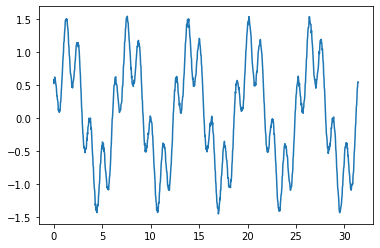

f_mean= 0.0487072633590831 1/(d*N)= 0.03179937889780471 handle freq= 16.010987275044673


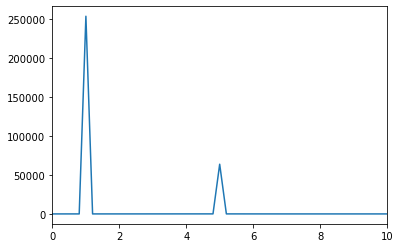

In [37]:
P = 10*np.pi
xx = np.linspace(0, P, 1007)
ff = np.sin(xx) + 0.5*np.cos(xx*5) + 0.1*np.random.random(1007)
plt.plot(xx, ff)
plt.show()

freq, p = myfft(xx, ff, window=None)
plt.plot(freq, p)

plt.xlim([0, 10])
plt.show()

# freq_num, p = myfft(xx, ff, window=None, num_output=True)
# plt.plot(freq_num, p)

# plt.xlim([0, 50])
# plt.show()